### DIP Assignment 4
### Name: Gnana Prakash Punnavajhala
### Roll No: 2021111027
---

# Imports

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

---

# Utility Function

In [2]:
def plot_image(image: np.ndarray, title: str, ax: plt.Axes = None) -> None:
    """Plot an image with a title.

    Args:
        image: The image to plot.
        title: The title of the plot.
        ax: The axis to plot on. If None, a new figure is created.
    """
    if ax is None:
        _, ax = plt.subplots()

    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.set_title(title)
    ax.axis('off')

---

# 1 Image Segmentation Using Thresholding

## 1.1 Binary, Adaptive and Otsu Thresholding

In [3]:
def binary_thresholding(image: np.ndarray, threshold: int = 127) -> np.ndarray:
    """Apply binary thresholding to an image.

    Args:
        image: The input image.
        threshold: The threshold value.

    Returns:
        The thresholded image.
    """
    _, thresholded_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)
    return thresholded_image

def adaptive_thresholding(image: np.ndarray, block_size: int = 11, constant: int = 2) -> np.ndarray:
    """Apply adaptive thresholding to an image.

    Args:
        image: The input image.
        block_size: The size of the local region for which the threshold is calculated.
        constant: A constant subtracted from the mean or weighted mean.

    Returns:
        The thresholded image.
    """
    return cv2.adaptiveThreshold(
        image,
        maxValue=255,
        adaptiveMethod=cv2.ADAPTIVE_THRESH_MEAN_C,
        thresholdType=cv2.THRESH_BINARY,
        blockSize=block_size,
        C=constant
    )

def otsu_thresholding(image: np.ndarray) -> np.ndarray:
    """Apply Otsu's thresholding to an image.

    Args:
        image: The input image.

    Returns:
        The thresholded image.
    """
    _, thresholded_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return thresholded_image

def threshold_image(image: np.ndarray, thresholding_function, **kwargs) -> np.ndarray:
    """Apply a thresholding function to an image.

    Args:
        image: The input image.
        thresholding_function: The thresholding function to apply.
        **kwargs: Additional keyword arguments to pass to the thresholding function.

    Returns:
        The thresholded image.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if image.ndim == 3 else image
    return thresholding_function(gray, **kwargs)

## 1.2 Testing on images

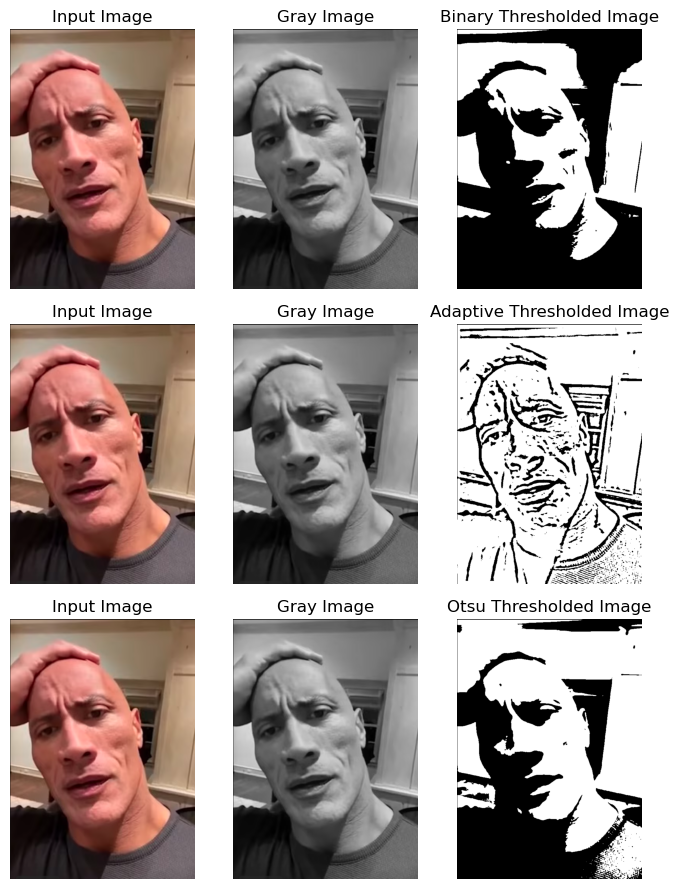

In [4]:
img_path = "../images/rock.png"

input_image = cv2.imread(img_path)
gray_image  = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

binary_thresholded_image = threshold_image(gray_image, binary_thresholding, threshold=127)
adaptive_thresholded_image = threshold_image(gray_image, adaptive_thresholding, block_size=21, constant=5)
otsu_thresholded_image = threshold_image(gray_image, otsu_thresholding)


_, axs = plt.subplots(3, 3, figsize=(7, 9))

plot_image(input_image, title="Input Image", ax=axs[0, 0])
plot_image(gray_image, title="Gray Image", ax=axs[0, 1])
plot_image(binary_thresholded_image, title="Binary Thresholded Image", ax=axs[0, 2])

plot_image(input_image, title="Input Image", ax=axs[1, 0])
plot_image(gray_image, title="Gray Image", ax=axs[1, 1])
plot_image(adaptive_thresholded_image, title="Adaptive Thresholded Image", ax=axs[1, 2])

plot_image(input_image, title="Input Image", ax=axs[2, 0])
plot_image(gray_image, title="Gray Image", ax=axs[2, 1])
plot_image(otsu_thresholded_image, title="Otsu Thresholded Image", ax=axs[2, 2])

plt.tight_layout()
plt.show()

## 1.3 Analysis of methods

### Binary Thresholding
- #### Applies a single threshold to the entire image
- #### Pixels above the threshold are set to `255` (white), and those below are set to `0` (black)
- #### Works well when the image has a uniform background

### Adaptive Thresholding
- #### Applies different thresholds to different regions of the image by considering the local neighbourhood of each pixel
- #### Uses the mean or Gaussian weighted mean of the neighbourhood as the threshold
- #### Works well when the image has varying illumination

### Otsu Thresholding
- #### Automatically calculates the optimal threshold by minimizing the intra-class variance
- #### Works well when the image has a bimodal histogram
- #### A bimodal histogram is one where the pixel intensities are distributed across two peaks in the image histogram

### Observations
- #### For my image, binary and Otsu thresholding fail to perform well
- #### Binary thresholding sets all the shadowy parts to black and the well-lit parts to white, which is what is expected from the function implementation
  - #### It is not able to find a great boundary for the face (in the sense that it is our brain that is able to identify the face, and not the thresholding function)
  - #### The hand and window borders also are not detected well
  - #### The image was captured during slight motion, which means that there is motion blur in the image too
  - #### This might not be that big of a problem, but the impact of the motion blur can be observed in the top part of the hand, which blends into the wall very well, and is not detected by this function
- #### Otsu thresholding fails to detect variations, and performs nearly as worse as binary thresholding
  - #### This method has similar modes of failure as binary thresholding
- #### Adaptive thresholding performs the best, as it is able to detect the variations in the image and segment it accordingly as it is considering the local neighbourhood of each pixel
  - #### We can observe the quality of performance in that it even detects the hands, lips, and even eyes very well
  - #### It is also able to very well segment the window in the background, which is not detected by the other two methods
- #### It also performs the best as it makes The Rock look like a JoJo character, which is a bonus (see the cell below this)

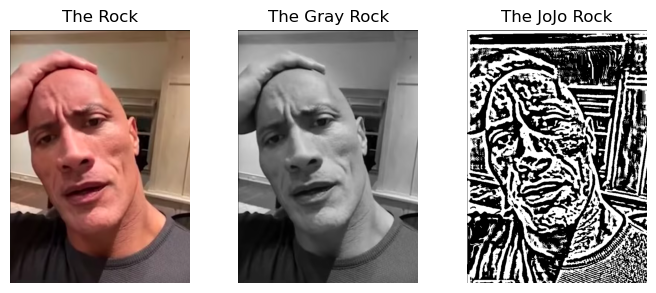

In [5]:
another_adaptive_thresholded_image = threshold_image(gray_image, adaptive_thresholding, block_size=21, constant=0)

_, axs = plt.subplots(1, 3, figsize=(7, 3))

plot_image(input_image, title="The Rock", ax=axs[0])
plot_image(gray_image, title="The Gray Rock", ax=axs[1])
plot_image(another_adaptive_thresholded_image, title="The JoJo Rock", ax=axs[2])

plt.tight_layout()
plt.show()

---

# 2 Line Detection Using Hough Transform

## 2.1 Hough Line Transform

In [6]:
def detect_and_highlight_lines(
        image: np.ndarray,
        reject_threshold: int = 50,
        accept_threshold: int = 150,
        aperture_size: int = 3,
        rho_resolution: float = 1.0,
        theta_resolution: float = np.pi / 180,
        threshold: int = 100
    ) -> np.ndarray:
    """Detects lines in an image using Hough Line Transform and highlights them.

    Args:
        image: The input image to perform line detection on.
        reject_threshold: The threshold for the lower bound in the Canny edge detector
            and lines having gradients below this threshold will be rejected.
        accept_threshold: The threshold for the upper bound in the Canny edge detector
            and lines having gradients above this threshold will be accepted.
        aperture_size: Size of the Sobel kernel used for the Canny edge detector.
        rho_resolution: The resolution of the accumulator, that represents the distance
            to the origin in the polar coordinate system.
        theta_resolution: The resolution of the parameter theta in radians.
        threshold: The minimum number of votes in the accumulator to consider a line valid.

    Returns:
        The image with the detected lines highlighted.
    """
    assert reject_threshold <= accept_threshold, "reject_threshold must be less than accept_threshold"
    assert aperture_size % 2 == 1 and 3 <= aperture_size <= 7, "aperture_size must be an odd number between 3 and 7"

    image = image.copy()

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if image.ndim == 3 else image

    edges = cv2.Canny(
        gray,
        threshold1=reject_threshold,
        threshold2=accept_threshold,
        apertureSize=aperture_size,
        L2gradient=True  # Setting this to true gives better edge quality
    )

    # This is the probabilistic implementation of the Hough Line Transform which is
    # more efficient than the standard Hough Line Transform implementation of OpenCV.
    lines = cv2.HoughLinesP(
        edges,
        rho=rho_resolution,
        theta=theta_resolution,
        threshold=threshold,
        maxLineGap=10000 # This is set to a large value to ensure that all lines are detected
    )

    if lines is not None:
        for ends in lines[:, 0]:
            cv2.line(image, tuple(ends[:2]), tuple(ends[2:]), (0, 0, 255), 1)

    return image

## 2.2 Testing on images

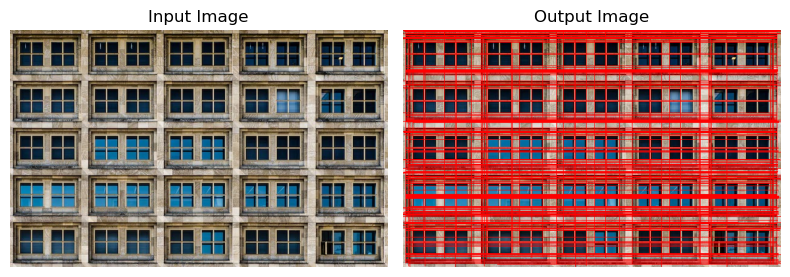

In [7]:
img_path = "../images/building.jpeg"

input_image = cv2.imread(img_path)
output_image = detect_and_highlight_lines(input_image)

_, axs = plt.subplots(1, 2, figsize=(8, 3))
plot_image(input_image, title="Input Image", ax=axs[0])
plot_image(output_image, title="Output Image", ax=axs[1])
plt.tight_layout()
plt.show()

---

## 2.3 Impact of parameters of Hough Line Transform

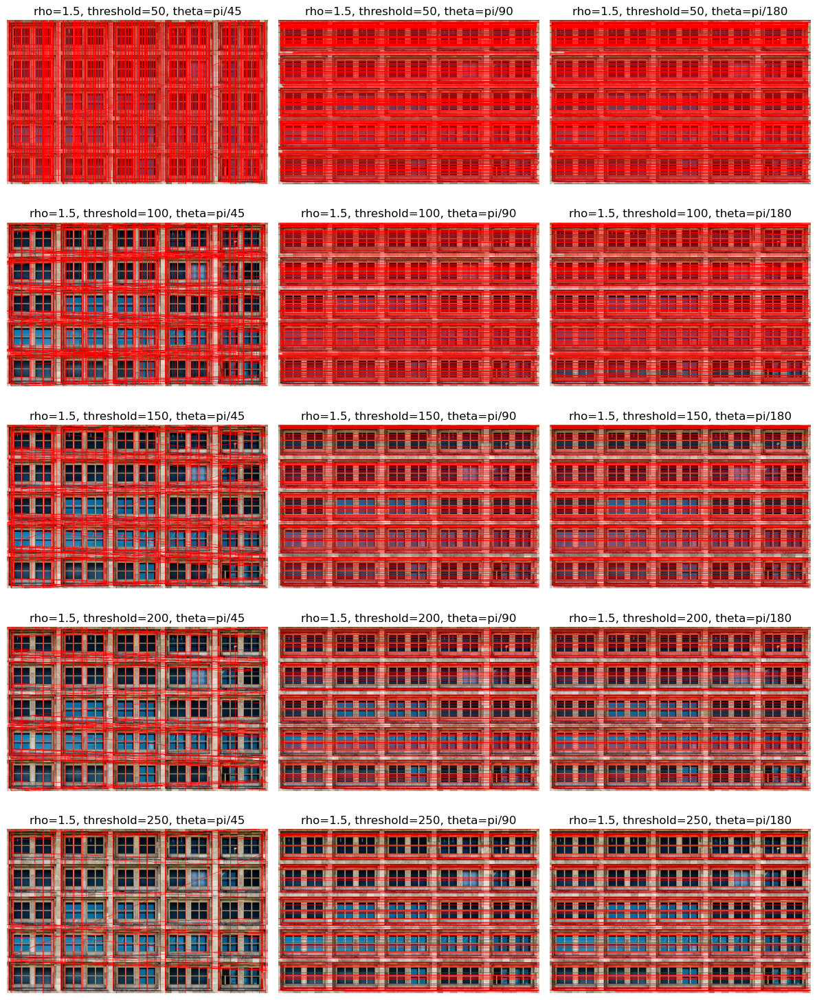

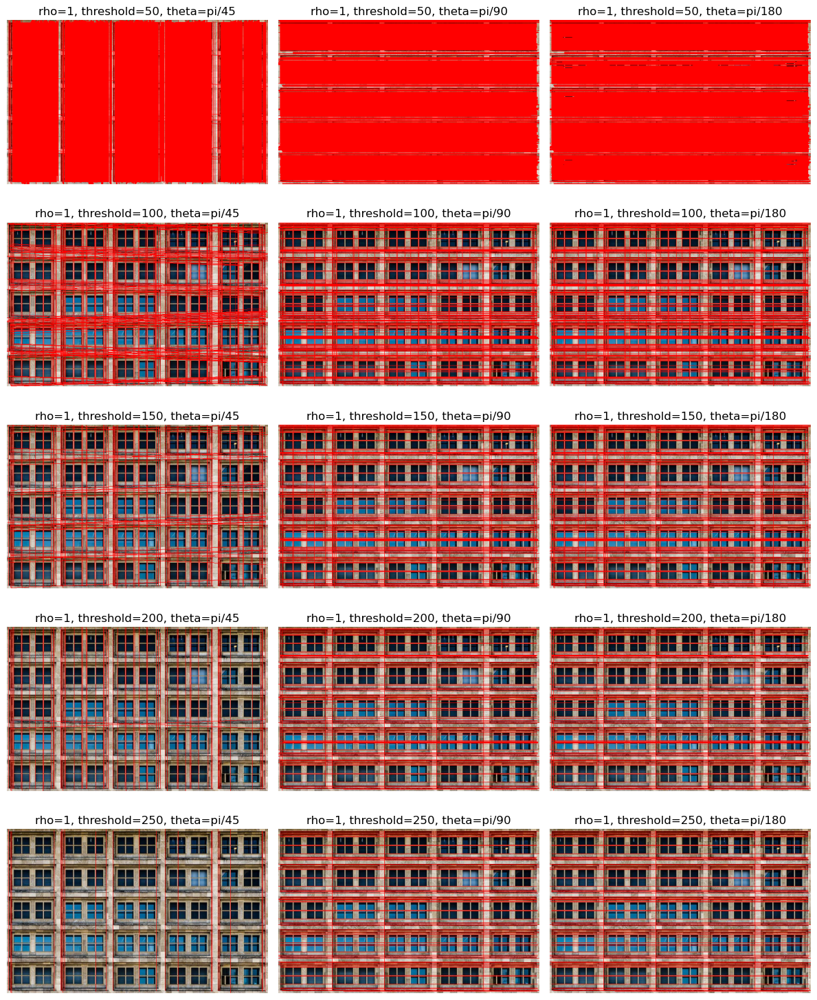

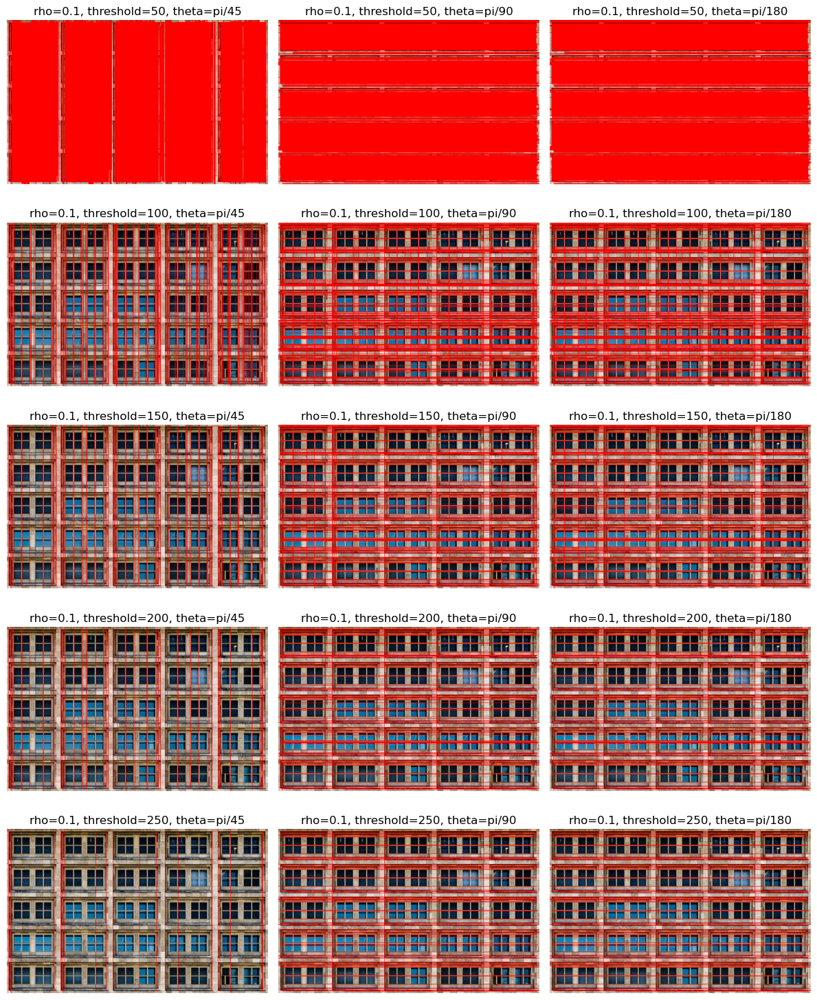

In [8]:
rho_resolutions   = [1.5, 1, 0.1]
thresholds        = [50, 100, 150, 200, 250]
theta_resolutions = [np.pi / 45, np.pi / 90, np.pi / 180]

for rho_resolution in rho_resolutions:
    _, axs = plt.subplots(len(thresholds), len(theta_resolutions), figsize=(12, 15))

    for i, threshold in enumerate(thresholds):
        for j, theta_resolution in enumerate(theta_resolutions):
            output_image = detect_and_highlight_lines(
                input_image,
                rho_resolution=rho_resolution,
                theta_resolution=theta_resolution,
                threshold=threshold
            )

            plot_image(output_image, title=f"rho={rho_resolution}, threshold={threshold}, theta=pi/{int(np.pi / theta_resolution)}", ax=axs[i, j])

    plt.tight_layout()
    plt.show()

### Observations
- #### Impact of `rho`
  - ##### The `rho_resolution` parameter is used to signify the resolution at which the parameter `rho` of the Hough Transform is sampled.
  - ##### This parameter is used to determine the distance resolution in pixels of the Hough grid.
  - ##### A higher value means that lesser number of possible distances are considered, for example, for a value of `1.5`, the possible distances are `0, 1.5, 3, 4.5`, etc., which leads to lesser number of lines being considered in the first place.
  - ##### This trend can be observed in the first row, third column of the plots for each `rho_resolution` value, where the value of `1.5` gives the leat dense plot, and the value of `0.1` gives the most dense plot.

- #### Impact of `theta`
  - ##### The `theta_resolution` parameter is used to signify the resolution at which the parameter `theta` of the Hough Transform is sampled.
  - ##### This parameter is used to determine the angular resolution in radians of the Hough grid.
  - ##### A higher value means that lesser number of possible angles are considered, for example, for a value of `pi/45`, the possible angles are `0, 4, 8, 12`, etc., which leads to lesser number of lines being considered in the first place.
  - ##### This trend can be observed across the first and second columns of each plot, where we can see that horizontal lines are not being detected for the value of `pi/45`, because this corresponds to an angular resolution of `4` degrees, which cannot divide `90` degrees, which is the angle of the horizontal lines in the image. Whereas, the resolutions of `pi/90` and `pi/180` can divide `90` degrees, and hence, horizontal lines are detected for these values.

- #### Impact of `threshold`
  - ##### The `threshold` parameter is used to signify the minimum number of votes that a line needs to have in order to be considered a line.
  - ##### A higher value means that only lines that have a higher number of votes are considered, and hence, only the most prominent lines are detected.
  - ##### This trend can be observed across all the rows of each figure, where the number of detected lines decreases as the threshold increases.
---

# 3 Circle Detection Using Hough Circle Transform

## 3.1 Hough Circle Transform

In [9]:
def detect_and_highlight_circles(
        image: np.ndarray,
        kernel_size: int = 5,
        dp: float = 1,
        min_dist: int = 20,
        param1: int = 100,
        param2: int = 50,
        min_radius: int = 0,
        max_radius: int = 0
    ) -> np.ndarray:
    """Detects circles in an image using Hough Circle Transform and highlights them.

    Args:
        image: The input image to perform circle detection on.
        kernel_size: The size of the kernel for the median blur operation.
        dp: The inverse ratio of the accumulator resolution to the image resolution.
        min_dist: The minimum distance between the centers of the detected circles.
        param1: The higher threshold of the two passed to the Canny edge detector.
        param2: The accumulator threshold for the circle centers at the detection stage.
        min_radius: The minimum radius of the circles to detect.
        max_radius: The maximum radius of the circles to detect. If 0, it is set to the maximum image dimension.

    Returns:
        The image with the detected circles highlighted.
    """
    assert kernel_size % 2 == 1 and kernel_size > 1, "kernel_size must be an odd number greater than 1"

    image = image.copy()

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if image.ndim == 3 else image
    gray = cv2.medianBlur(gray, kernel_size)

    circles = cv2.HoughCircles(
        gray,
        method=cv2.HOUGH_GRADIENT,
        dp=dp,
        minDist=min_dist,
        param1=param1,
        param2=param2,
        minRadius=min_radius,
        maxRadius=max_radius
    )

    if circles is not None:
        circles = np.uint16(np.around(circles))
        for circle in circles[0, :]:
            center = (circle[0], circle[1])
            radius = circle[2]
            cv2.circle(image, center, 3, (0, 255, 0), 3)
            cv2.circle(image, center, radius, (0, 0, 255), 3)
            cv2.line(image, center, (circle[0] + radius, circle[1]), (255, 0, 0), 2)

    return image

## 3.2 Testing on images

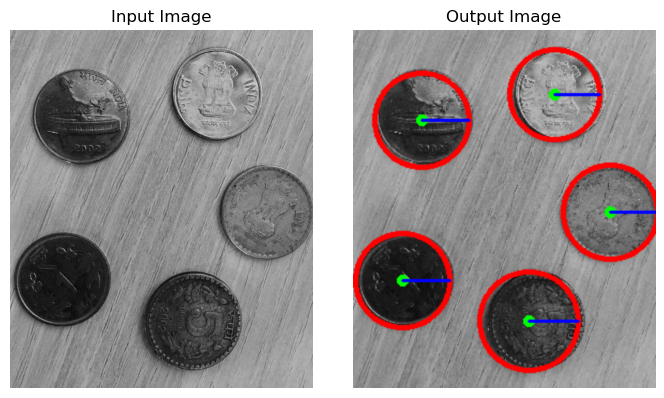

In [10]:
img_path = "../images/coin-detection.jpg"

input_image = cv2.imread(img_path)
original_shape = input_image.shape

# For large images, the HoughCircles function is taking a lot of time to execute.
resized_image = cv2.resize(input_image, (original_shape[1] // 8, original_shape[0] // 8))

output_image = detect_and_highlight_circles(resized_image)
output_image = cv2.resize(output_image, (original_shape[1], original_shape[0]))

_, axs = plt.subplots(1, 2, figsize=(7, 4))

plot_image(input_image, title="Input Image", ax=axs[0])
plot_image(output_image, title="Output Image", ax=axs[1])
plt.tight_layout()
plt.show()

---

## 3.3 Impact of parameters of Hough Circle Transform

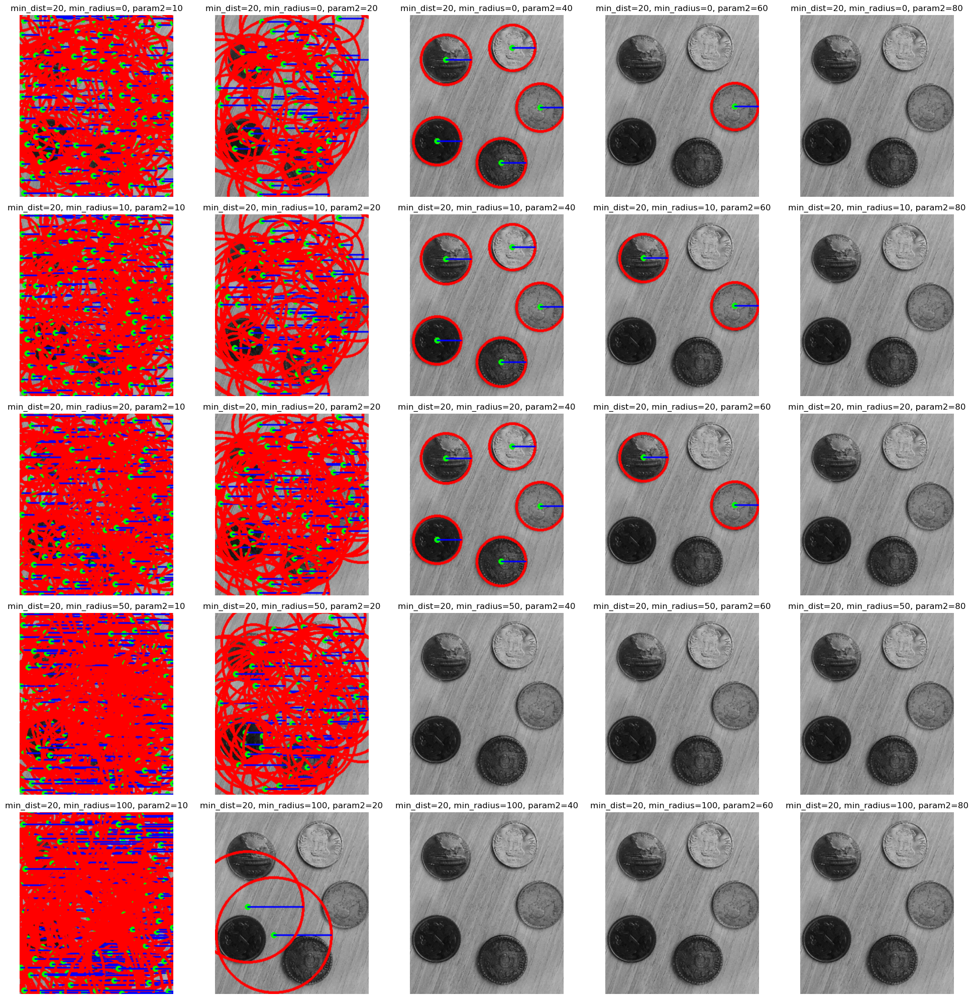

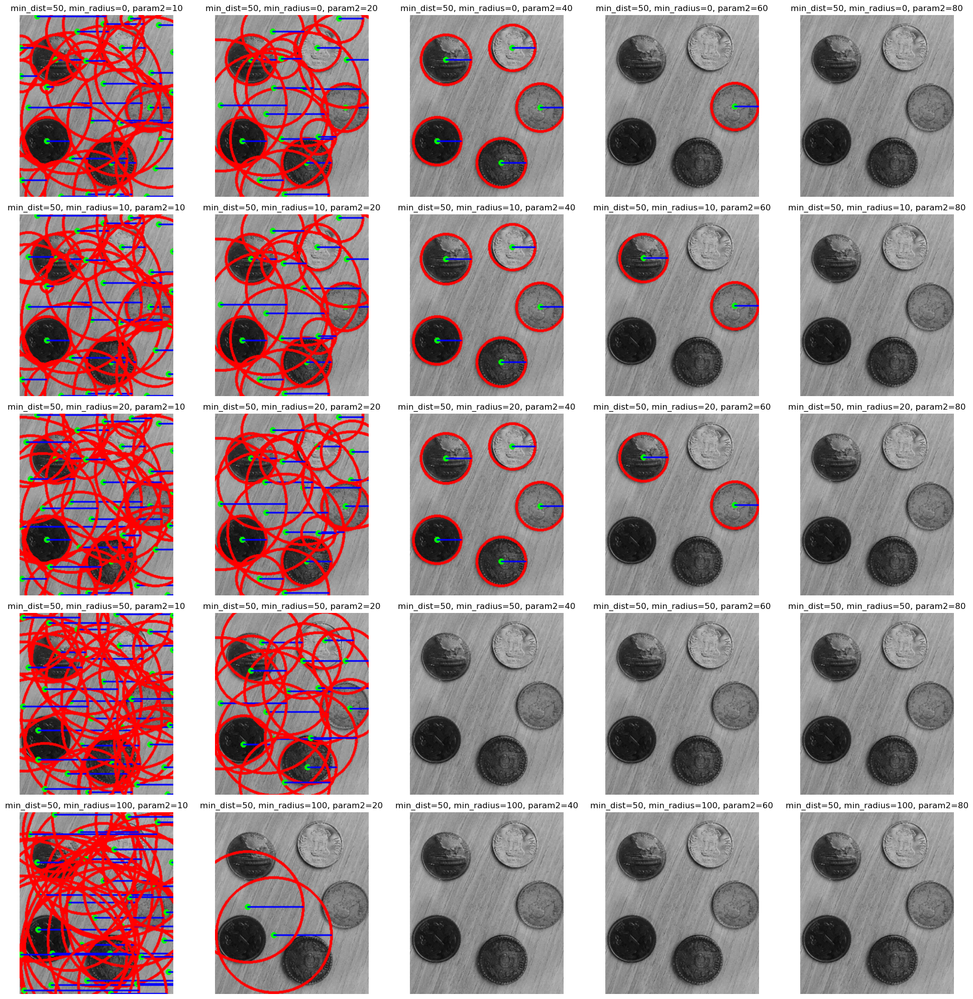

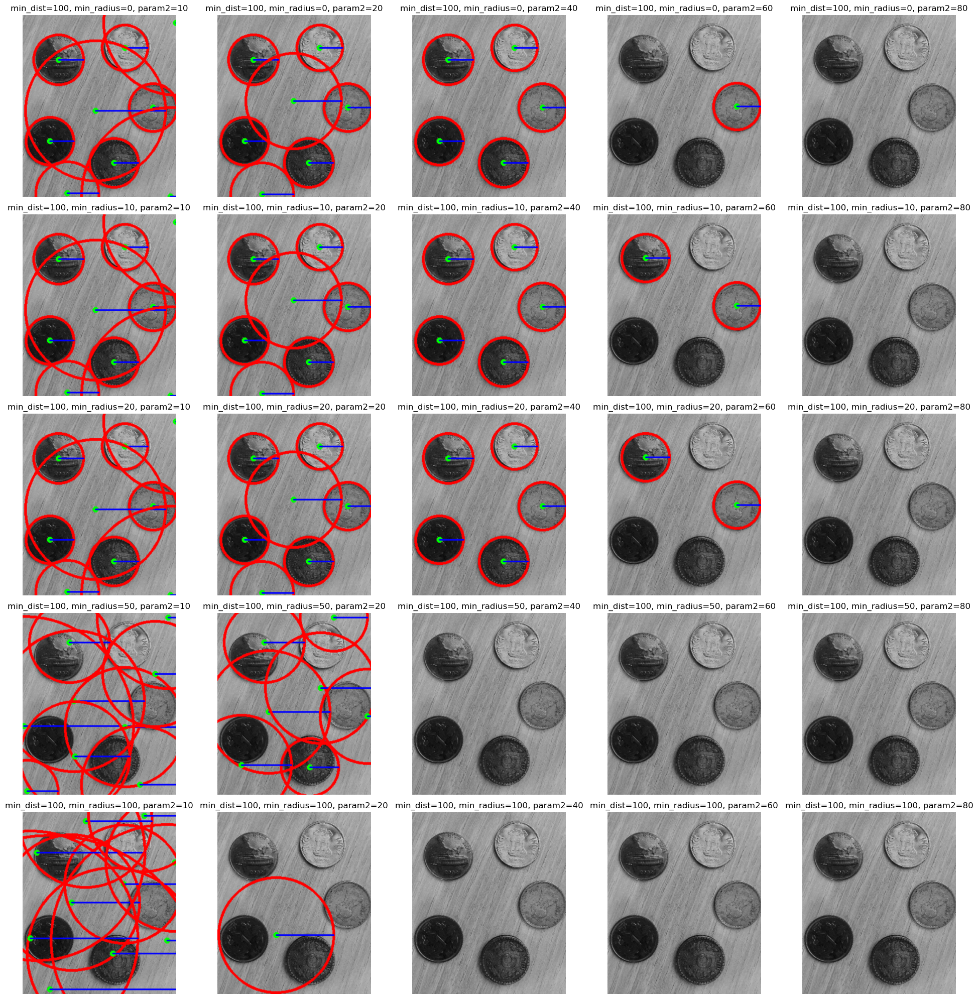

In [11]:
min_dists = [20, 50, 100]
radii     = [0, 10, 20, 50, 100]
param2s   = [10, 20, 40, 60, 80]

for min_dist in min_dists:
    _, axs = plt.subplots(len(radii), len(param2s), figsize=(20, 20))

    for i, radius in enumerate(radii):
        for j, param2 in enumerate(param2s):
            output_image = detect_and_highlight_circles(
                resized_image,
                min_dist=min_dist,
                min_radius=radius,
                param2=param2
            )

            output_image = cv2.resize(output_image, (original_shape[1], original_shape[0]))
            plot_image(output_image, title=f"min_dist={min_dist}, min_radius={radius}, param2={param2}", ax=axs[i, j])

    plt.tight_layout()
    plt.show()

### Observations
- #### All parameters must be used with moderate values to get the optimal results.
- #### The `min_radius` and `max_radius` parameters are used to specify the range of radii that the Hough Circle Transform should consider.
- #### I have set `max_radius` to be `0`, which means that the maximum radius is set to be the maximum of the height and width of the image.

- #### Impact of min_dist
  - ##### This parameter signifies the minimum distance that must be present between the centers of two circles.
  - ##### As we can see, the `min_dist` parameter does not have as significant of an impact as the other parameters
  - ##### Regardless, a high value of this parameter can help in reducing the number of circles detected, as can be observed across the figures.

- #### Impact of min_radius
  - ##### This parameter signifies the minimum radius of the circles that the Hough Circle Transform should consider.
  - ##### As we can see, the `min_radius` parameter has an immediate impact when its value is set above the radius of the circles we want to detect in the image, as can be observed in the case of values greater than or equal to `50`.

- #### Impact of param2
  - ##### This parameter denotes the accumulator threshold during circle detection, and plays the most important role in the detection quality of the circles.
  - ##### It can be seen from the above figures that a value of `40` almost always gives the best results, if the other parameters are set to agreeable values.
  - ##### Values higher than this fail to detect all circles, and even those that are supposed to be detected are not considered
---

# 4 Harris Corner Detection

## 4.1 Harris Corner Detector

In [12]:
def harris_detector(
        image: np.ndarray,
        block_size: int = 2,
        ksize: int = 3,
        k: float = 0.04,
        response_threshold: float = 0.01
    ) -> np.ndarray:
    """Detect corners in an image using the Harris Corner Detector.

    Args:
        image: The input image to detect corners on.
        block_size: The size of the local region for which the Harris corner detector is calculated.
        ksize: The size of the Sobel kernel used to calculate the image derivatives.
        k: The Harris detector free parameter.
        response_threshold: The threshold value for corner detection.

    Returns:
        The image with the detected corners highlighted.
    """
    image = image.copy()

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if image.ndim == 3 else image
    gray = np.float32(gray)

    corners = cv2.cornerHarris(gray, blockSize=block_size, ksize=ksize, k=k)
    corners = cv2.dilate(corners, None)

    filtered_corners = corners > response_threshold * corners.max()
    image[filtered_corners] = [0, 0, 255]

    return image

## 4.2 Testing on images

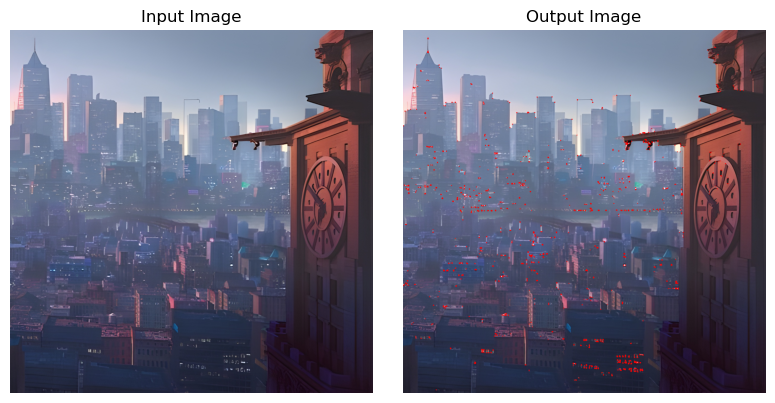

In [13]:
img_path = "../images/spider_verse.jpeg"

input_image = cv2.imread(img_path)

output_image = harris_detector(input_image)

_, axs = plt.subplots(1, 2, figsize=(8, 4))

plot_image(input_image, title="Input Image", ax=axs[0])
plot_image(output_image, title="Output Image", ax=axs[1])

plt.tight_layout()
plt.show()

## 4.3 Impact of Sensitivity Parameter

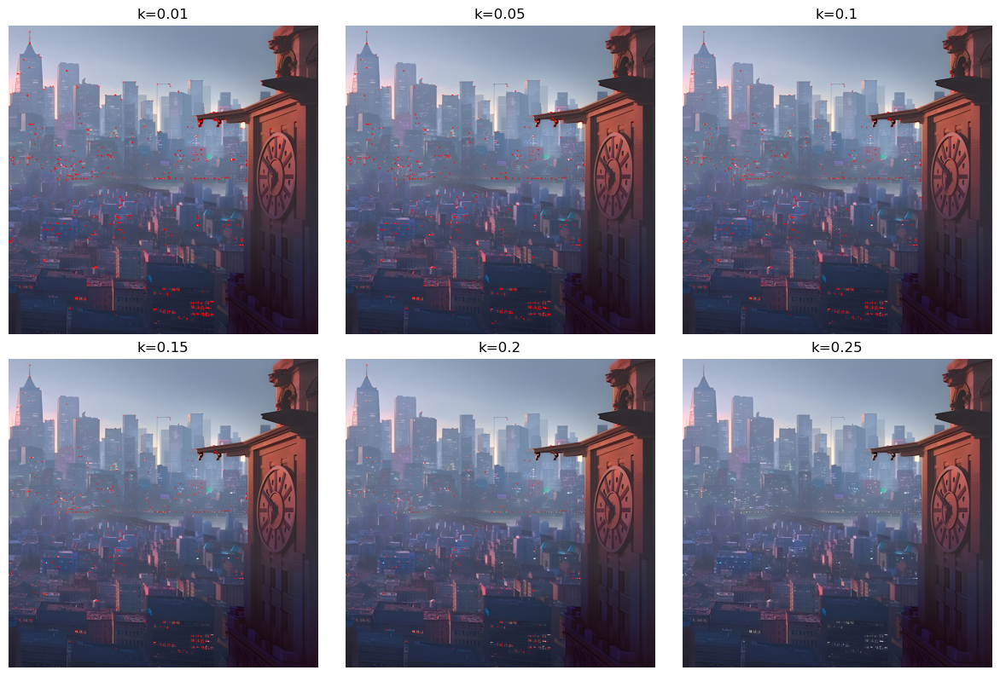

In [14]:
k_values = [0.01, 0.05, 0.1, 0.15, 0.2, 0.25]

_, axs = plt.subplots(2, 3, figsize=(12, 8))

for i, k in enumerate(k_values):
    output_image = harris_detector(input_image, k=k)
    plot_image(output_image, title=f"k={k}", ax=axs[i // 3, i % 3])

plt.tight_layout()
plt.show()

### Observations
- #### The sensitivity parameter is used to determine the threshold for the Harris Corner Detector.
- #### A higher value means that only the most prominent corners are detected, and a lower value means that more corners are detected.
- #### As we can see from the above figures, lower values identify way too many corners, but it is bound to happen since there are many buildings in the image, and the corners of the buildings are detected as corners.
- #### To control the number of corners detected, we can increase the sensitivity parameter, which will only detect the most prominent corners
---

# 5 Short Theory
- #### [Reference](https://sbme-tutorials.github.io/2021/cv/notes/4_week4.html)
- #### The Hough Transform identifies geometric shapes in an image by mapping points in the image space to curves in a parameter space. The approach differs significantly when detecting lines versus circles due to differences in parameterization and computational requirements.

## Detecting Lines
- #### A line in Cartesian space can be represented using the polar form:
$$
\rho = x \cos \theta + y \sin \theta
$$
#### where:
- #### $\rho$: Perpendicular distance from the origin.
- #### $\theta$: Angle of the line's normal with the x-axis.

- #### The parameter space for line detection is 2D ($\rho, \theta$). A single point in the image corresponds to a sinusoidal curve in the parameter space. Multiple collinear points intersect at a single point in the parameter space, indicating the presence of a line. 

### Computational Complexity:
- #### The complexity primarily depends on the resolution of the accumulator array in the $(\rho, \theta)$ space, and edge pixels are mapped across all potential angles. It is relatively efficient since only two parameters are involved.

## Detecting Circles
- #### A circle is represented by:
$$
(x - a)^2 + (y - b)^2 = r^2
$$
#### where:
- #### $a, b$: Center of the circle.
- #### $r$: Radius.

- #### Here, the parameter space is 3D ($a, b, r$). Each edge point votes for all potential circles passing through it, considering the range of possible radii. This significantly increases computational cost as every edge pixel contributes to a larger parameter space.

### Computational Complexity:
- #### The accumulator grows exponentially with the number of parameters (3D for circles vs. 2D for lines). To mitigate this, techniques like the Circular Hough Transform focus on known or constrained radius ranges.

### Summary of Differences:
| Feature              | Lines                   | Circles                  |
|----------------------|-------------------------|--------------------------|
| Equation             | $\rho = x \cos \theta + y \sin \theta$ | $(x - a)^2 + (y - b)^2 = r^2$ |
| Parameters           | $\rho, \theta$ (2D)  | $a, b, r$ (3D)         |
| Computational Cost   | Moderate               | High                     |
| Applications         | Road/edge detection    | Detecting circular shapes like coins. |

- #### The additional dimension for circles makes their detection computationally heavier, but it allows for precise identification of circular shapes in noisy images.
---